# Reference genome testing - Merging

<div class="alert alert-warning">
    
**What the fourth section (Merging) does**
    
This section merges the different datasets and visualizes the merged data. The section contains the following important subsections:

* Merging <br>
* Alignment parameter visualization <br>
</div> 


### Loading libraries
Using sc2_seurat environment

In [1]:
import sys
print(sys.executable)
print(sys.version)
print(sys.version_info)

/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/bin/python
3.9.9 | packaged by conda-forge | (main, Dec 20 2021, 02:40:17) 
[GCC 9.4.0]
sys.version_info(major=3, minor=9, micro=9, releaselevel='final', serial=0)


In [2]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))#embed HTML within IPython notebook and make containers 90% of screen
import numpy as np
import pandas as pd
import anndata as ad
import scanpy as sc
import seaborn as sns
import os
import matplotlib.pyplot as plt

%matplotlib inline
sc.settings.verbosity = 0             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=80, facecolor='white') #figure resolution and background color

# This is used
# os.path.join('data/'+object_names[i][6:10]+'_preprocessed.h5ad')
#sc.logging.print_versions()

## Load data
The filtered .h5ad  files from preprocessing section.

In [3]:
#siletti
siletti_standard_reg_processed='/home/hers_basak/jjiang/jack/outputs/deliverables/0_testing/0_reference_genome_testing_custom_siletti/data/siletti_standard_f1_reg_processed_1.h5ad'
siletti_custom_reg_processed='/home/hers_basak/jjiang/jack/outputs/deliverables/0_testing/0_reference_genome_testing_custom_siletti/data/siletti_custom_f1_reg_processed_1.h5ad'


#altena
altena_standard_reg_processed='/home/hers_basak/jjiang/jack/outputs/deliverables/0_testing/0_reference_genome_testing_custom_siletti/data/altena_standard_f1_reg_processed_1.h5ad'
altena_custom_reg_processed='/home/hers_basak/jjiang/jack/outputs/deliverables/0_testing/0_reference_genome_testing_custom_siletti/data/altena_custom_f1_reg_processed_1.h5ad'


In [3]:
#siletti
siletti_standard_processed='/home/hers_basak/jjiang/jack/outputs/deliverables/0_testing/0_reference_genome_testing_custom_siletti/data/siletti_standard_f1_processed_1.h5ad'
siletti_custom_processed='/home/hers_basak/jjiang/jack/outputs/deliverables/0_testing/0_reference_genome_testing_custom_siletti/data/siletti_custom_f1_processed_1.h5ad'


#altena
altena_standard_processed='/home/hers_basak/jjiang/jack/outputs/deliverables/0_testing/0_reference_genome_testing_custom_siletti/data/altena_standard_f1_processed_1.h5ad'
altena_custom_processed='/home/hers_basak/jjiang/jack/outputs/deliverables/0_testing/0_reference_genome_testing_custom_siletti/data/altena_custom_f1_processed_1.h5ad'


In [4]:
#set data path
os.chdir('/home/hers_basak/jjiang/jack/outputs/deliverables/0_testing/0_reference_genome_testing_custom_siletti')

In [5]:
os.getcwd()

'/hpc/hers_basak/rnaseq_data/Basaklab/jjiang/outputs/deliverables/0_testing/0_reference_genome_testing_custom_siletti'

In [7]:
!ls data/

altena_custom_f1_processed_1.h5ad
altena_custom_f1_reg_processed_1.h5ad
altena_custom_filtered_1.h5ad
altena_custom_preprocessed.h5ad
altena_standard_f1_processed_1.h5ad
altena_standard_f1_reg_processed_1.h5ad
altena_standard_filtered_1.h5ad
altena_standard_preprocessed.h5ad
siletti_custom_f1_processed_1.h5ad
siletti_custom_f1_reg_processed_1.h5ad
siletti_custom_filtered_1.h5ad
siletti_custom_preprocessed.h5ad
siletti_standard_f1_processed_1.h5ad
siletti_standard_f1_reg_processed_1.h5ad
siletti_standard_filtered_1.h5ad
siletti_standard_preprocessed.h5ad


In [8]:
files = [siletti_standard_reg_processed, siletti_custom_reg_processed, altena_standard_reg_processed, altena_custom_reg_processed]

In [6]:
files = [siletti_standard_processed, siletti_custom_processed, altena_standard_processed, altena_custom_processed]

In [8]:
names = [name.split('_reg_processed')[0].split('/data/')[1] for name in files ]
print(names)

['siletti_standard_f1', 'siletti_custom_f1', 'altena_standard_f1', 'altena_custom_f1']


In [7]:
names = [name.split('_processed')[0].split('/data/')[1] for name in files ]
print(names)

['siletti_standard_f1', 'siletti_custom_f1', 'altena_standard_f1', 'altena_custom_f1']


In [11]:
object_names_processed=list()
numberobj = len(files)

for i in range(numberobj):
    object_names_processed.append("adata"+"_"+names[i]+"_reg_"+"processed")
    locals()[object_names_processed[i]] = sc.read(files[i]) 
    print(object_names_processed[i],' is loaded')

adata_siletti_standard_f1_reg_processed  is loaded
adata_siletti_custom_f1_reg_processed  is loaded
adata_altena_standard_f1_reg_processed  is loaded
adata_altena_custom_f1_reg_processed  is loaded


In [8]:
object_names_processed=list()
numberobj = len(files)

for i in range(numberobj):
    object_names_processed.append("adata"+"_"+names[i]+"_"+"processed")
    locals()[object_names_processed[i]] = sc.read(files[i]) 
    print(object_names_processed[i],' is loaded')

adata_siletti_standard_f1_processed  is loaded
adata_siletti_custom_f1_processed  is loaded
adata_altena_standard_f1_processed  is loaded
adata_altena_custom_f1_processed  is loaded


In [11]:
for i in range(numberobj):
    locals()[object_names_processed[i]].obs['atlas'] = locals()[object_names_processed[i]].obs['atlas'].replace('anna', 'altena')

In [14]:
locals()[object_names_processed[0]].obs_names

Index(['AAACCCAAGTTTCGAC', 'AAACCCACATCGTTCC', 'AAACCCAGTTATTCTC',
       'AAACCCATCGAGAGCA', 'AAACCCATCGGAGTGA', 'AAACCCATCTTCCACG',
       'AAACGAAAGCAACAAT', 'AAACGAAGTCGTCGGT', 'AAACGAAGTGCGAACA',
       'AAACGAAGTGTTGATC',
       ...
       'TTTGGTTAGACATGCG', 'TTTGGTTAGGGTAGCT', 'TTTGGTTCAATCGTCA',
       'TTTGGTTCACTACCCT', 'TTTGGTTGTGACATCT', 'TTTGGTTGTGAGTAAT',
       'TTTGGTTTCGCCTATC', 'TTTGGTTTCTAAGAAG', 'TTTGTTGCACCCAAGC',
       'TTTGTTGCAGGCATTT'],
      dtype='object', length=7535)

In [9]:
#To make reproducible plots
np.random.seed(41)

In [13]:
standard

NameError: name 'standard' is not defined

In [10]:
standard=ad.concat([ adata_siletti_standard_f1_processed, adata_altena_standard_f1_processed],  join="outer", fill_value=0)
standard.obs_names_make_unique()
custom=ad.concat([adata_siletti_custom_f1_processed,adata_altena_custom_f1_processed],  join="outer", fill_value=0)
custom.obs_names_make_unique()

/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [11]:
cells_standard = set(standard.obs_names)
cells_custom = set(custom.obs_names)
intersecting_cells = cells_standard.intersection(cells_custom)

genes_standard = set(standard.var_names)
genes_custom = set(custom.var_names)
intersecting_genes = genes_standard.intersection(genes_custom)

# Filter both AnnData objects to retain only intersecting cells
filtered_standard = standard[standard.obs_names.isin(intersecting_cells)].copy()
filtered_custom = custom[custom.obs_names.isin(intersecting_cells)].copy()

# Filter both AnnData objects to retain only intersecting genes
filtered_standard = filtered_standard[:, filtered_standard.var_names.isin(intersecting_genes)].copy()
filtered_custom = filtered_custom[:, filtered_custom.var_names.isin(intersecting_genes)].copy()


In [12]:
from scipy.stats import spearmanr
import numpy as np

# Assuming adata_1 and adata_2 are your AnnData objects

# Extract expression matrices from the AnnData objects
expression_standard = filtered_standard.X.toarray()  # Assuming X contains the expression matrix of adata_1
expression_custom = filtered_custom.X.toarray()  # Assuming X contains the expression matrix of adata_2

from scipy.spatial.distance import euclidean
distances = []
for i in range(len(expression_standard)):
    dist = euclidean(expression_standard[i], expression_custom[i])
    distances.append(dist)

average_distance = np.mean(distances)
print(f"Average pairwise distance between common observations: {average_distance}")

median_distance = np.median(distances)
print(f"Median pairwise distance between common observations: {median_distance}")


Average pairwise distance between common observations: 31.585006149073227
Median pairwise distance between common observations: 9.322549819946289


In [ ]:
max(distances)

In [19]:
for i in distances:
    if i>20:
        print(distances.index(i))
        break

5461


In [20]:
for i in distances[5461:]:
    if i<20:
        print(distances.index(i))
        break

10872


In [19]:
high_distance =standard[5461:10872]

In [20]:
high_distance2=custom[5461:10872]

In [21]:
high = ad.concat([high_distance,high_distance2])
high.obs_names_make_unique()

/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [22]:
high

AnnData object with n_obs × n_vars = 10822 × 31149
    obs: 'n_counts', 'species', 'sample_group', 'atlas', 'reference', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'total_counts_mito', 'total_counts_norm'
    obsm: 'X_pca', 'X_umap'

In [26]:
high_distance.obs_names=[f'{name}{high_distance.obs['atlas']}']

SyntaxError: f-string: unmatched '[' (<ipython-input-26-c5584eeaedd2>, line 1)

In [26]:
annotation=sc.read_h5ad('/home/hers_basak/jjiang/jack/outputs/deliverables/5_integration/data/scvi/models/scvi_model_final/adata_predicted_lowest.h5ad')

In [27]:
annotation.obs_names

Index(['N3_CTGTGCTTCAGAAATG', 'N3_GCTCCTACAGATCCAT', 'N3_TCAGCAATCGGTCCGA',
       'N3_TGACTAGTCACAGGCC', 'N3_TACGGATTCTGTACGA', 'N3_GGCTGGTCACGGTGTC',
       'N3_TTGGCAACAGACACTT', 'N3_TGACTAGTCATCACCC', 'N3_GTTACAGCATGATCCA',
       'N3_GTAGTCAGTAGCTTGT',
       ...
       'GTTGTCCTCATGCATG-1', 'GTGCTTCAGCGTGTTT-1', 'CGGGCATTCGATGCTA-1-1',
       'AACGAAACAGGCTCTG-1-1', 'ACCCTTGCAAGCGATG-1', 'TGGGAGATCACGGTCG-1-1',
       'TGTTGGACATCTTCGC-1', 'TTACGTTGTCAACCTA-1', 'TGTACAGAGGTGCGAT-1-1',
       'TTGCGTCGTCAAGCCC-1'],
      dtype='object', length=522220)

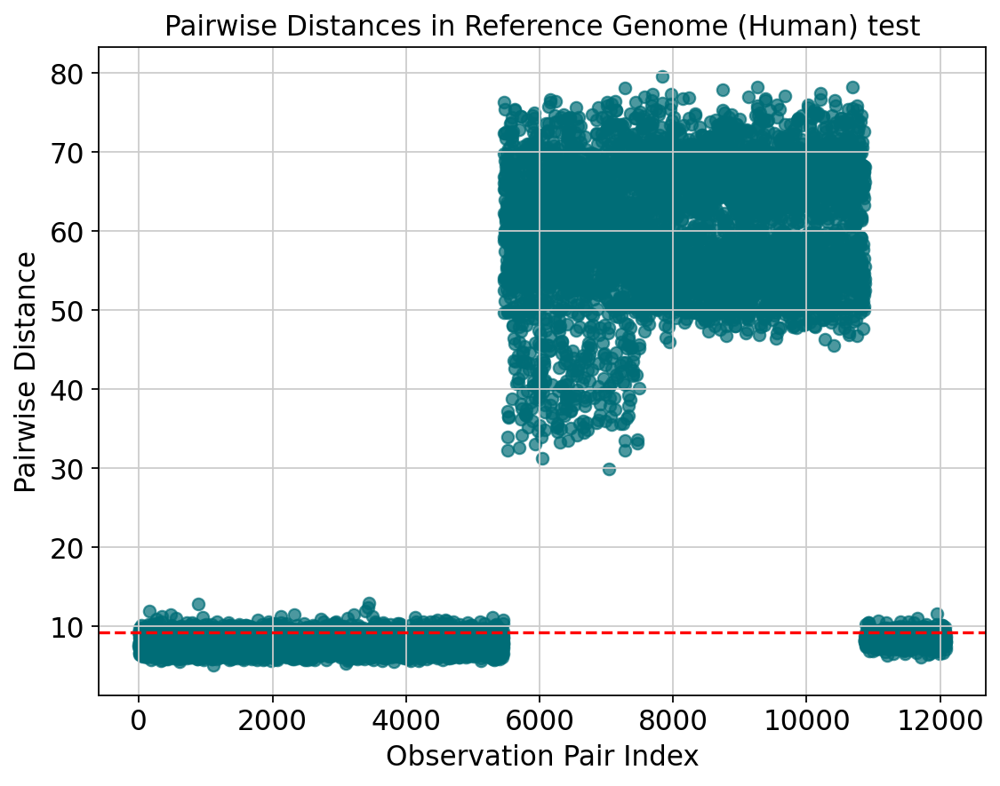

In [18]:
plt.figure(figsize=(8, 6))
plt.scatter(range(len(distances)), distances, color='#006d77', alpha=0.7)
plt.axhline(median_distance, color='red', linestyle='--', label='Median')
plt.xlabel('Observation Pair Index')
plt.ylabel('Pairwise Distance')
plt.title('Pairwise Distances in Reference Genome (Human) test')
plt.savefig('/home/hers_basak/jjiang/jack/outputs/deliverables/6_analysis/custom_distance.png')
plt.show()

# Concatenating 

## Siletti only

In [12]:
adata_merge_siletti = ad.concat([adata_siletti_standard_f1_processed, adata_siletti_custom_f1_processed],  join="outer", fill_value=0)

merged_adata = adata_merge_siletti


merged_adata.obs_names_make_unique()

sc.tl.pca(merged_adata, svd_solver='arpack')

nn= 15 #default 15
sc.pp.neighbors(merged_adata, n_neighbors=nn, n_pcs=40) # causes well mix between reference genomes
sc.tl.umap(merged_adata)



/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/sklearn/manifold/_spectral_embedding.py:260: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


<AxesSubplot:title={'center':'reference'}, xlabel='UMAP1', ylabel='UMAP2'>

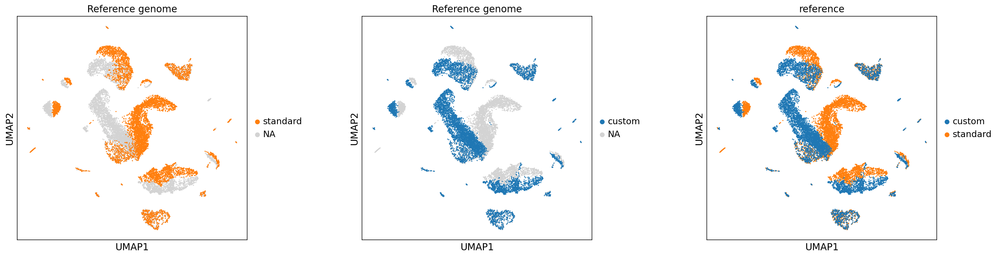

In [13]:
feature= 'reference'
group1= 'standard'
group2= 'custom'

fig, axs = plt.subplots(1, 3, figsize = [24,6])
#axs[-1, -1].axis('off')
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.5)
sc.pl.umap(merged_adata, color=feature, groups= group1, use_raw=False, s=10, ax= axs[0],show=False, title='Reference genome')
sc.pl.umap(merged_adata, color=feature, groups= group2, use_raw=False, s=10, ax= axs[1],show=False, title='Reference genome')
sc.pl.umap(merged_adata, color=feature, use_raw=False, s=10, ax= axs[2],show=False)
#fig.savefig('figures/merge/merge_siletti_subplots.png',bbox_inches='tight')

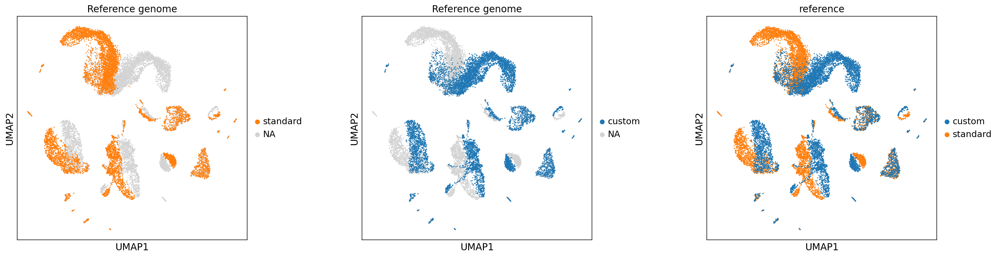

In [14]:
feature= 'reference'
group1= 'standard'
group2= 'custom'

fig, axs = plt.subplots(1, 3, figsize = [24,6])
#axs[-1, -1].axis('off')
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.5)
sc.pl.umap(merged_adata, color=feature, groups= group1, use_raw=False, s=10, ax= axs[0],show=False, title='Reference genome')
sc.pl.umap(merged_adata, color=feature, groups= group2, use_raw=False, s=10, ax= axs[1],show=False, title='Reference genome')
sc.pl.umap(merged_adata, color=feature, use_raw=False, s=10, ax= axs[2],show=False)
fig.savefig('figures/merge/merge_siletti_subplots.png',bbox_inches='tight')

In [12]:
adata_merge_siletti = ad.concat([adata_siletti_standard_f1_reg_processed, adata_siletti_custom_f1_reg_processed],  join="outer", fill_value=0)

merged_adata = adata_merge_siletti


merged_adata.obs_names_make_unique()

sc.tl.pca(merged_adata, svd_solver='arpack')

nn= 15 #default 15
sc.pp.neighbors(merged_adata, n_neighbors=nn, n_pcs=40) # causes well mix between reference genomes
sc.tl.umap(merged_adata)



/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/sklearn/manifold/_spectral_embedding.py:260: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


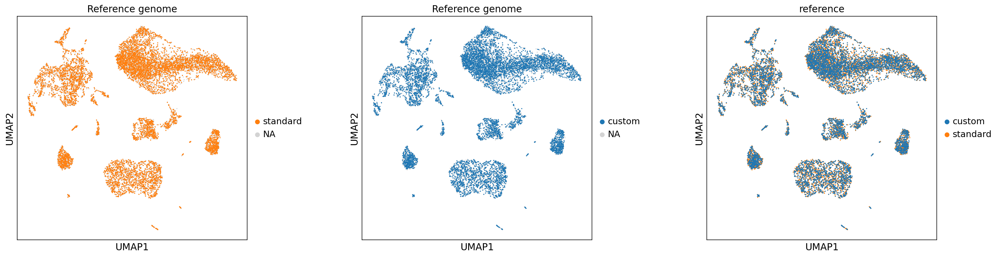

In [13]:
feature= 'reference'
group1= 'standard'
group2= 'custom'

fig, axs = plt.subplots(1, 3, figsize = [24,6])
#axs[-1, -1].axis('off')
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.5)
sc.pl.umap(merged_adata, color=feature, groups= group1, use_raw=False, s=10, ax= axs[0],show=False, title='Reference genome')
sc.pl.umap(merged_adata, color=feature, groups= group2, use_raw=False, s=10, ax= axs[1],show=False, title='Reference genome')
sc.pl.umap(merged_adata, color=feature, use_raw=False, s=10, ax= axs[2],show=False)
fig.savefig('figures/merge/merge_siletti_subplots.png',bbox_inches='tight')

## altena

In [15]:
adata_merge_altena = ad.concat([adata_altena_standard_f1_processed,
adata_altena_custom_f1_processed ],  join="outer", fill_value=0)

merged_adata = adata_merge_altena


merged_adata.obs_names_make_unique()

sc.tl.pca(merged_adata, svd_solver='arpack')

nn= 15 #default 15
sc.pp.neighbors(merged_adata, n_neighbors=nn, n_pcs=40) # causes well mix between reference genomes
sc.tl.umap(merged_adata)


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


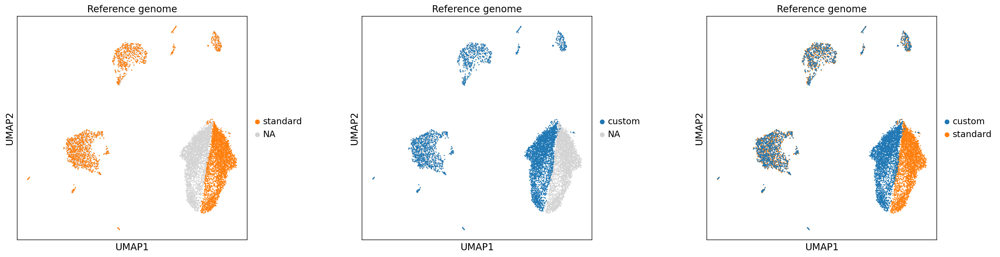

In [16]:
feature= 'reference'
group1= 'standard'
group2= 'custom'
fig, axs = plt.subplots(1, 3, figsize =[24,6])
#axs[-1, -1].axis('off')
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.5)
sc.pl.umap(merged_adata, color=feature, groups= group1, use_raw=False, s=10, ax= axs[0],show=False, title='Reference genome')
sc.pl.umap(merged_adata, color=feature, groups= group2, use_raw=False, s=10, ax= axs[1],show=False, title='Reference genome')
sc.pl.umap(merged_adata, color=feature, use_raw=False, s=10, ax= axs[2],show=False, title='Reference genome')
fig.savefig('figures/merge/merge_altena_subplots.png',bbox_inches='tight')

In [14]:
adata_merge_altena = ad.concat([adata_altena_standard_f1_reg_processed,
adata_altena_custom_f1_reg_processed ],  join="outer", fill_value=0)

merged_adata = adata_merge_altena


merged_adata.obs_names_make_unique()

sc.tl.pca(merged_adata, svd_solver='arpack')

nn= 15 #default 15
sc.pp.neighbors(merged_adata, n_neighbors=nn, n_pcs=40) # causes well mix between reference genomes
sc.tl.umap(merged_adata)


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


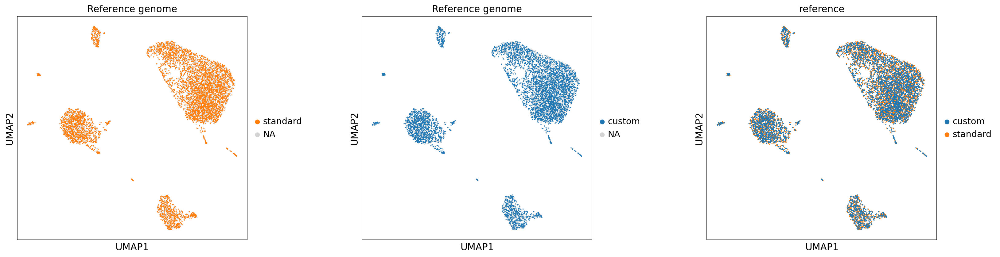

In [16]:
feature= 'reference'
group1= 'standard'
group2= 'custom'
fig, axs = plt.subplots(1, 3, figsize =[24,6])
#axs[-1, -1].axis('off')
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.5)
sc.pl.umap(merged_adata, color=feature, groups= group1, use_raw=False, s=10, ax= axs[0],show=False, title='Reference genome')
sc.pl.umap(merged_adata, color=feature, groups= group2, use_raw=False, s=10, ax= axs[1],show=False, title='Reference genome')
sc.pl.umap(merged_adata, color=feature, use_raw=False, s=10, ax= axs[2],show=False, title='Reference genome')
fig.savefig('figures/merge/merge_altena_subplots.png',bbox_inches='tight')

## All data

In [23]:
adata_merge = ad.concat([adata_siletti_standard_f1_processed, adata_siletti_custom_f1_processed ,adata_altena_standard_f1_processed, adata_altena_custom_f1_processed],  join="outer", fill_value=0)
adata_merge.obs_names_make_unique()

/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [12]:
adata_merge = ad.concat([adata_siletti_standard_f1_reg_processed, adata_siletti_custom_f1_reg_processed ,adata_altena_standard_f1_reg_processed, adata_altena_custom_f1_reg_processed],  join="outer", fill_value=0)
adata_merge.obs_names_make_unique()

/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


pca again

In [24]:
sc.tl.pca(adata_merge, svd_solver='arpack')
#    sc.tl.pca(locals()[object_names_reg[i]], svd_solver='arpack')

In [25]:
nn= 15 #default 15
sc.pp.neighbors(adata_merge, n_neighbors=nn, n_pcs=40)
sc.tl.umap(adata_merge)

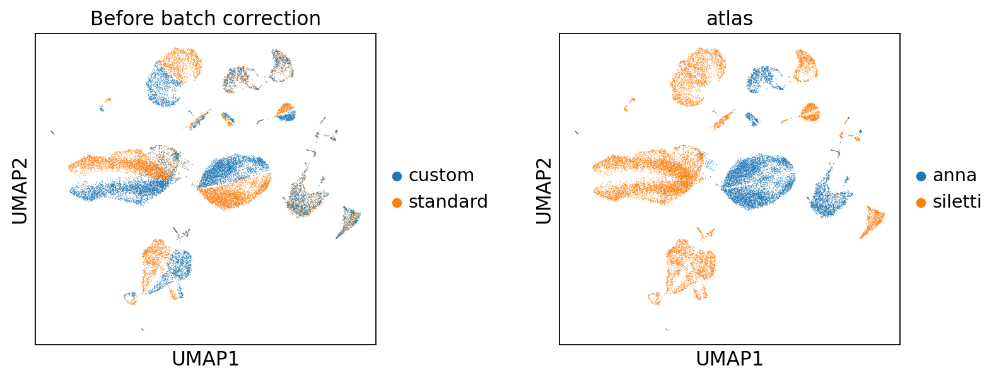

In [70]:
sc.pl.umap(adata_merge,color=['reference', 'atlas'], wspace=0.4,s=1, title='Before batch correction')

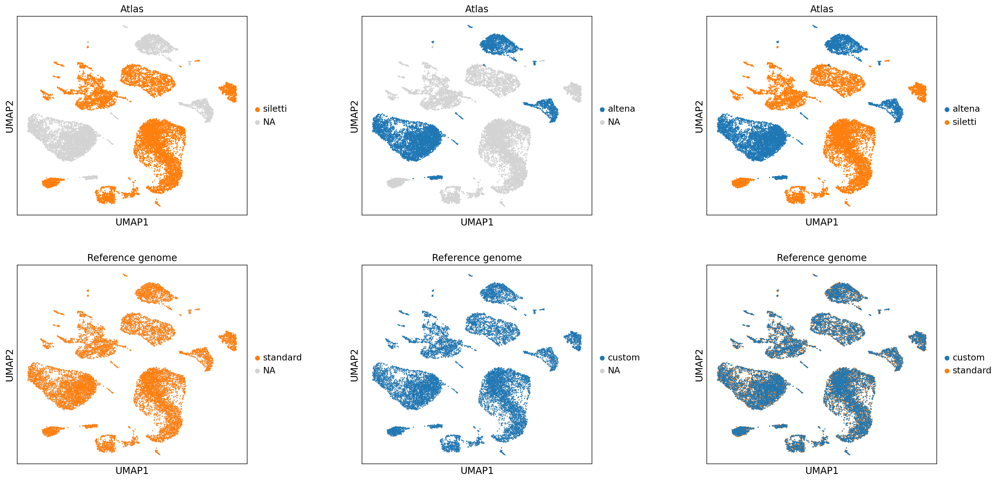

In [17]:
fig, axs = plt.subplots(2, 3, figsize = [24,12])
#axs[-1, -1].axis('off')
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.25)
sc.pl.umap(adata_merge, color='atlas', groups= 'siletti', use_raw=False, s=10, ax= axs[0,0],show=False, title='Atlas')
sc.pl.umap(adata_merge, color='atlas', groups= 'altena', use_raw=False, s=10, ax= axs[0,1],show=False, title='Atlas')
sc.pl.umap(adata_merge, color='atlas', use_raw=False, s=10, ax= axs[0,2],show=False, title='Atlas')
sc.pl.umap(adata_merge, color='reference', groups= 'standard', use_raw=False, s=10, ax= axs[1,0],show=False, title='Reference genome')
sc.pl.umap(adata_merge, color='reference', groups= 'custom', use_raw=False, s=10, ax= axs[1,1],show=False, title='Reference genome')
sc.pl.umap(adata_merge, color='reference', use_raw=False, s=10, ax= axs[1,2],show=False, title='Reference genome')
fig.savefig('figures/merge/merge_all_subplots.png',bbox_inches='tight')

In [44]:
high_distance

View of AnnData object with n_obs × n_vars = 5411 × 31724
    obs: 'n_counts', 'species', 'sample_group', 'atlas', 'reference', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'total_counts_mito', 'total_counts_norm'
    obsm: 'X_pca', 'X_umap'

In [26]:
b =adata_merge.obs_names.isin(high.obs_names.tolist())

In [27]:
adata_merge.obs['high_distance'] = b.astype(str)

FileNotFoundError: [Errno 2] No such file or directory: 'figures/umap/home/hers_basak/jjiang/jack/outputs/deliverables/6_analysis/high_distance.png'

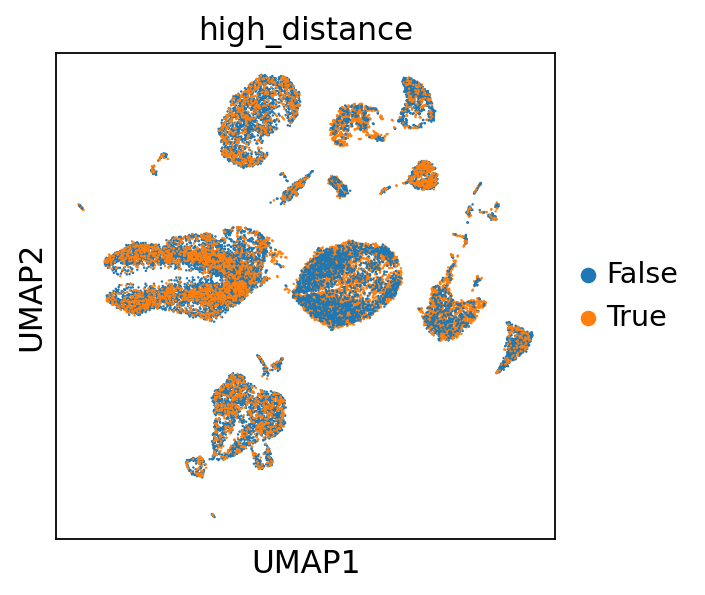

In [28]:
sc.pl.umap(adata_merge, color='high_distance', show=True,save= '/home/hers_basak/jjiang/jack/outputs/deliverables/6_analysis/high_distance.png')

In [55]:
adata_merge[adata_merge.obs_names.isin(high_distance.obs_names.tolist())].obs['atlas'].value_counts()

anna       3333
siletti    2078
Name: atlas, dtype: int64

In [ ]:

    if adata_merge.obs['species'][0] == 'Homo sapien':
        sc.pl.umap(adata_merge, color=['GFAP', 'PLP1', 'RBFOX3','GAD1','GAD2', 'TH','SLC17A6'],title=['Gfap (Astrocytes)', 'Plp1(Oligodendrocytes)', 'Rbfox3(post-mitotic neurons)', 'Gad1 (GABA-ergic)','Gad2 (GABA-ergic)', 'Slc17a6 (gutamatergic)', 'Th (dopaminergic)'], use_raw=True, s=1
           ,save = "merge_umap_high_subplot.png")
    else:
        sc.pl.umap(adata_merge, color=['Gfap', 'Plp1', 'Rbfox3','Gad1','Gad2', 'Slc17a6','Th'],title=['Gfap (Astrocytes)', 'Plp1(Oligodendrocytes)', 'Rbfox3(post-mitotic neurons)', 'Gad1 (GABA-ergic)','Gad2 (GABA-ergic)', 'Slc17a6 (gutamatergic)', 'Th (dopaminergic)'], use_raw=False, s=25
                  )#,save = "_merge_umap_n"+str(nn)+"_2.pdf")

# Batch Correction

In [38]:
adata_merge_rb = adata_merge.copy()

In [45]:
sc.external.pp.harmony_integrate(adata_merge_rb, key =['atlas'])

ValueError: operands could not be broadcast together with shapes (99,24370) (100,1) 

In [ ]:
sc.tl.pca(adata_merge_rb, svd_solver='arpack')

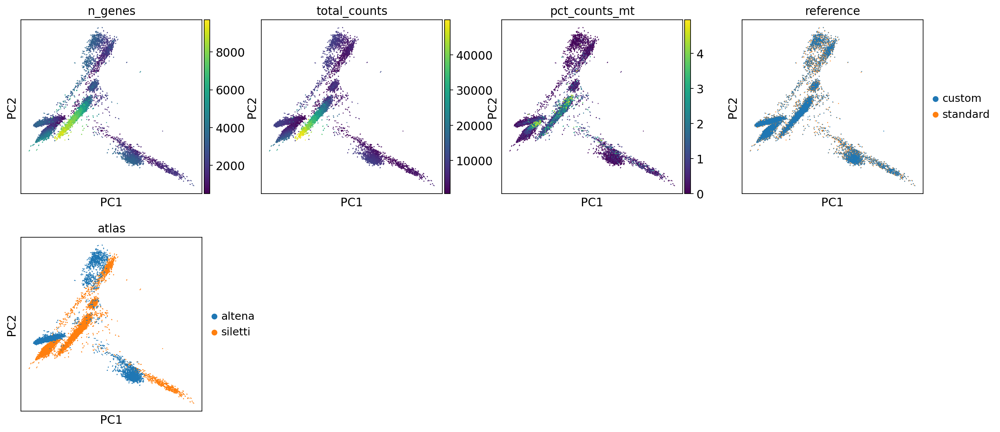

In [23]:
sc.pl.pca(adata_merge, color=['n_genes', 'total_counts', 'pct_counts_mt', 'reference', 'atlas'], save = "_merge_pca_1.pdf")
#    sc.pl.pca(locals()[object_names_reg[i]], color=['n_genes', 'total_counts', 'pct_counts_mt'], save = "_"+object_names_reg[i]+"_intron_metrics_1.pdf")


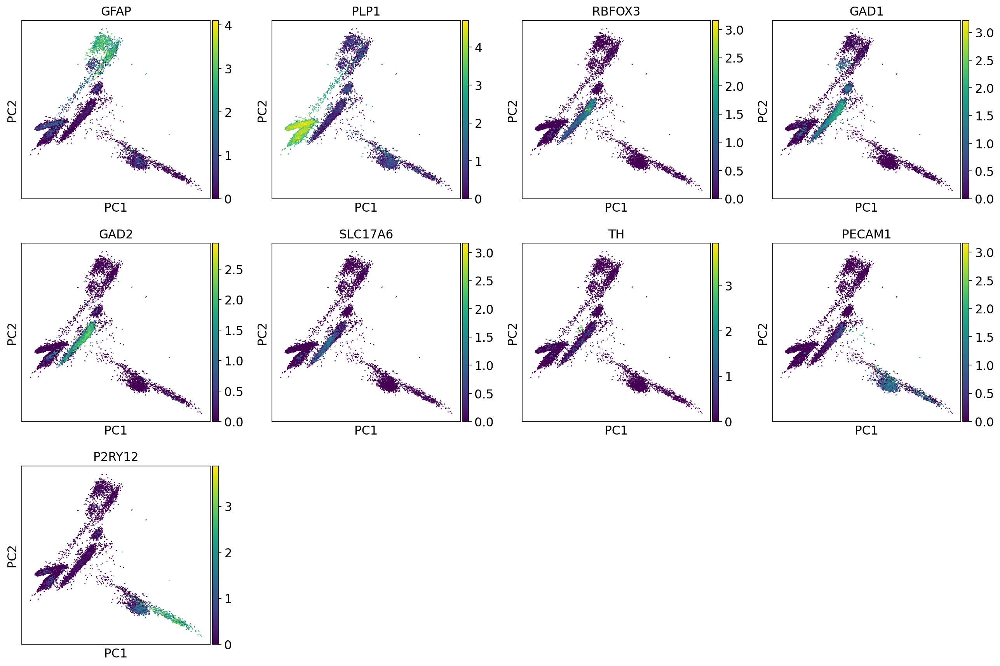

In [24]:
sc.pl.pca(adata_merge_rb, color=['GFAP', 'PLP1', 'RBFOX3','GAD1','GAD2','SLC17A6','TH','PECAM1','P2RY12' ])

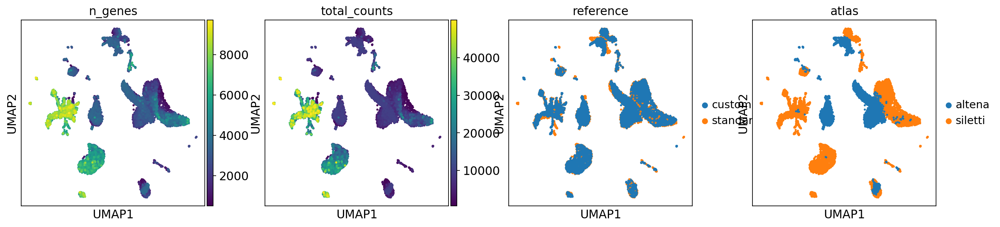

In [49]:
sc.pp.neighbors(adata_merge_rb, n_neighbors=40, n_pcs=40,use_rep='X_pca_harmony')
sc.tl.umap(adata_merge_rb)
sc.pl.umap(adata_merge_rb, color=['n_genes', 'total_counts','reference', 'atlas'], 
           use_raw=False, s=25,save = '_merge_batch_rb_1.pdf')

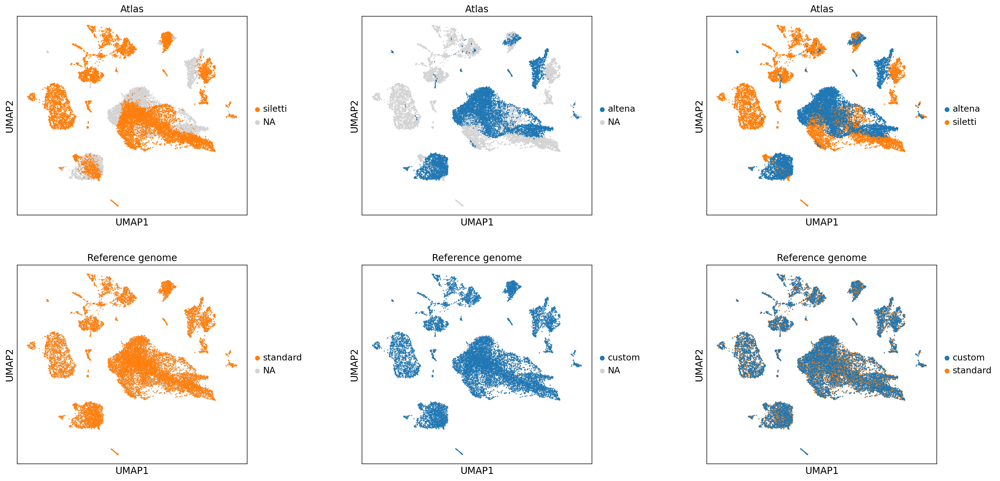

In [26]:
fig, axs = plt.subplots(2, 3, figsize = [24,12])
#axs[-1, -1].axis('off')
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.25)
sc.pl.umap(adata_merge_rb, color='atlas', groups= 'siletti', use_raw=False, s=10, ax= axs[0,0],show=False, title='Atlas')
sc.pl.umap(adata_merge_rb, color='atlas', groups= 'altena', use_raw=False, s=10, ax= axs[0,1],show=False, title='Atlas')
sc.pl.umap(adata_merge_rb, color='atlas', use_raw=False, s=10, ax= axs[0,2],show=False, title='Atlas')
sc.pl.umap(adata_merge_rb, color='reference', groups= 'standard', use_raw=False, s=10, ax= axs[1,0],show=False, title='Reference genome')
sc.pl.umap(adata_merge_rb, color='reference', groups= 'custom', use_raw=False, s=10, ax= axs[1,1],show=False, title='Reference genome')
sc.pl.umap(adata_merge_rb, color='reference', use_raw=False, s=10, ax= axs[1,2],show=False, title='Reference genome')
fig.savefig('figures/merge/merge_batch_rb_subplots.png',bbox_inches='tight')

In [27]:
atlas_ref = adata_merge_rb.obs['atlas'].astype(str)+ "_" + adata_merge_rb.obs['reference'].astype(str)
adata_merge_rb.obs['atlas_ref'] = atlas_ref

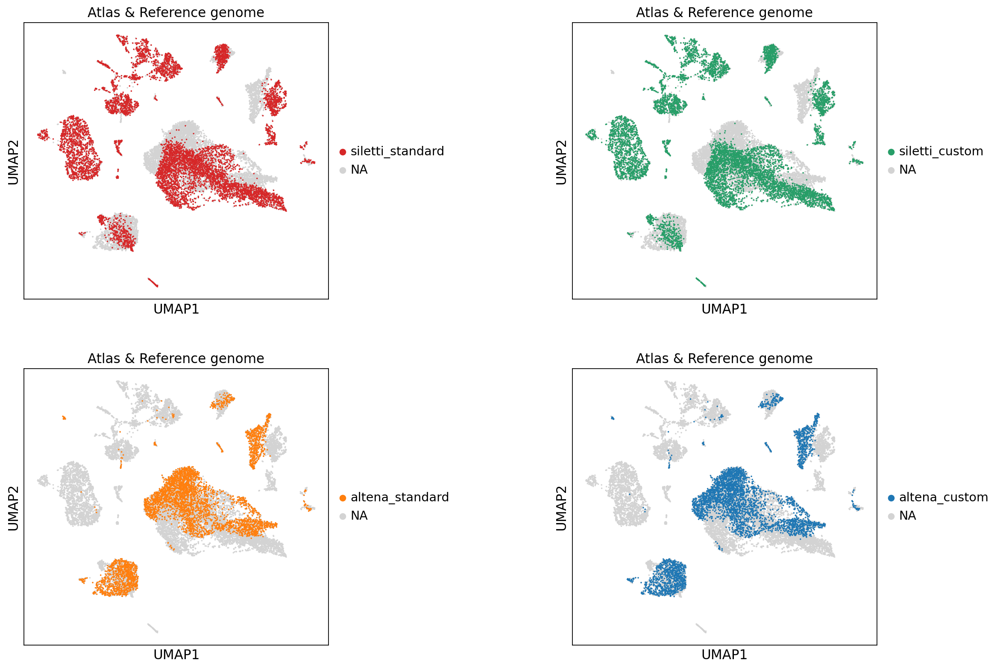

In [28]:
fig, axs = plt.subplots(2, 2, figsize = [16,12])
#axs[-1, -1].axis('off')
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.8, hspace=0.25)
sc.pl.umap(adata_merge_rb, color='atlas_ref', groups= 'siletti_standard', use_raw=False, s=10, ax= axs[0,0],show=False, title='Atlas & Reference genome')
sc.pl.umap(adata_merge_rb, color='atlas_ref', groups= 'siletti_custom', use_raw=False, s=10, ax= axs[0,1],show=False, title='Atlas & Reference genome')
sc.pl.umap(adata_merge_rb, color='atlas_ref', groups= 'altena_standard', use_raw=False, s=10, ax= axs[1,0],show=False, title='Atlas & Reference genome')
sc.pl.umap(adata_merge_rb, color='atlas_ref', groups= 'altena_custom', use_raw=False, s=10, ax= axs[1,1],show=False, title='Atlas & Reference genome')
#sc.pl.umap(adata_merge_rb, color='atlas_ref', use_raw=False, s=25, ax= axs[0,2],show=False)
fig.savefig('figures/merge/merge_batch_rb_specific_subplots.png',bbox_inches='tight')

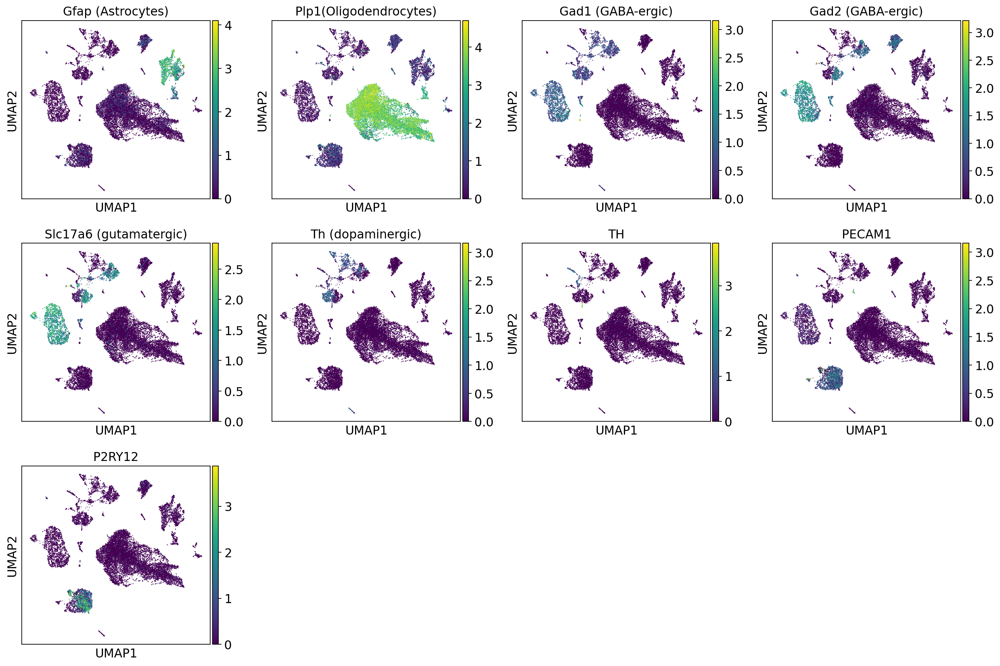

In [29]:
sc.pl.umap(adata_merge_rb, color=['GFAP', 'PLP1', 'RBFOX3','GAD1','GAD2','SLC17A6','TH','PECAM1','P2RY12' ],title=['Gfap (Astrocytes)', 'Plp1(Oligodendrocytes)', 'Gad1 (GABA-ergic)','Gad2 (GABA-ergic)', 'Slc17a6 (gutamatergic)', 'Th (dopaminergic)'],  s=3)
   #save = "_merge_umap_n"+str(nn)+"_2.pdf")

worked


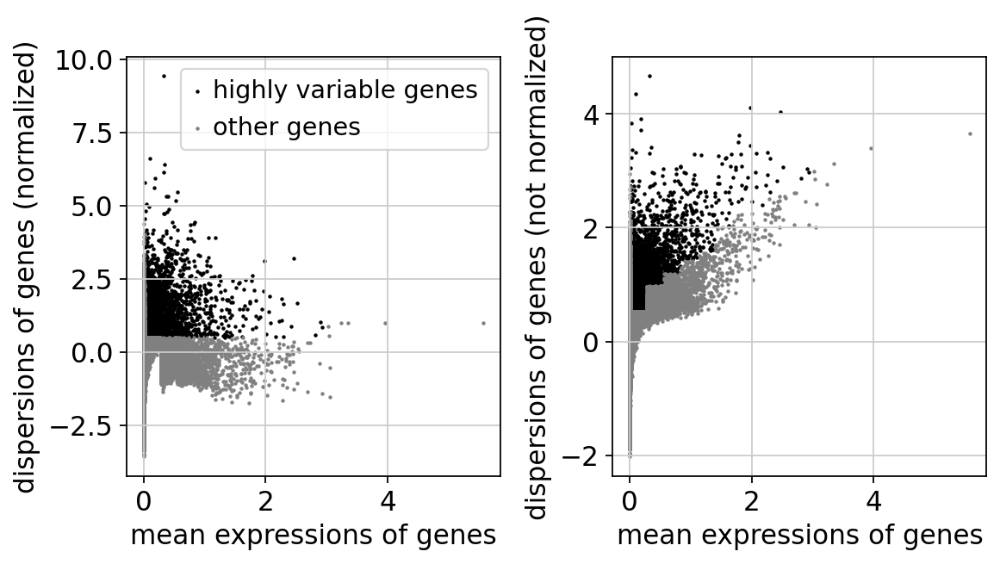

In [50]:
sc.pp.highly_variable_genes(adata_merge_rb, min_mean=0.0125, max_mean=3, min_disp=0.5,flavor='seurat') #seurat_v3 is giving an error
print('worked')
sc.pl.highly_variable_genes(adata_merge_rb)

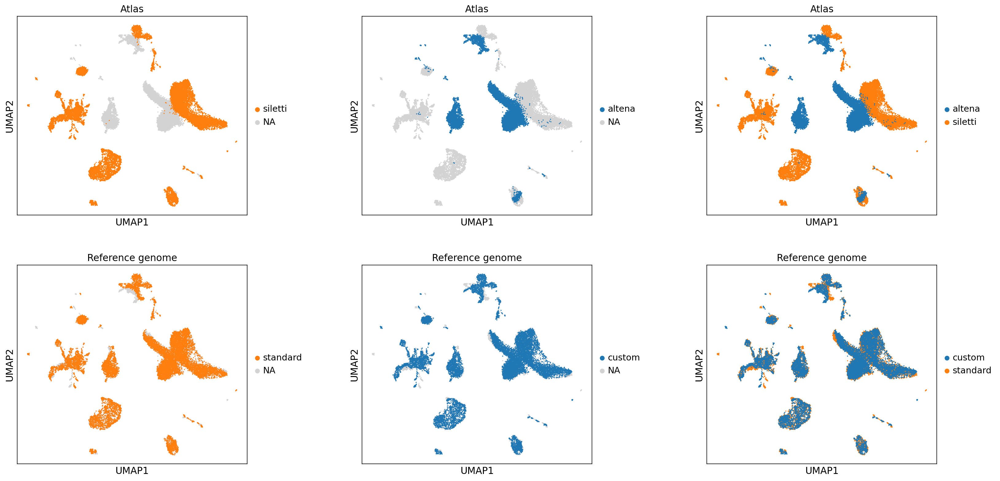

In [51]:
fig, axs = plt.subplots(2, 3, figsize = [24,12])
#axs[-1, -1].axis('off')
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.25)
sc.pl.umap(adata_merge_rb, color='atlas', groups= 'siletti', use_raw=False, s=10, ax= axs[0,0],show=False, title='Atlas')
sc.pl.umap(adata_merge_rb, color='atlas', groups= 'altena', use_raw=False, s=10, ax= axs[0,1],show=False, title='Atlas')
sc.pl.umap(adata_merge_rb, color='atlas', use_raw=False, s=10, ax= axs[0,2],show=False, title='Atlas')
sc.pl.umap(adata_merge_rb, color='reference', groups= 'standard', use_raw=False, s=10, ax= axs[1,0],show=False, title='Reference genome')
sc.pl.umap(adata_merge_rb, color='reference', groups= 'custom', use_raw=False, s=10, ax= axs[1,1],show=False, title='Reference genome')
sc.pl.umap(adata_merge_rb, color='reference', use_raw=False, s=10, ax= axs[1,2],show=False, title='Reference genome')
fig.savefig('figures/merge/merge_batch_rb_subplots.png',bbox_inches='tight')